In [1]:
import torch
import numpy as np
import math
import matplotlib.pyplot as plt
import IPython.display as ipd
import soundfile as sf

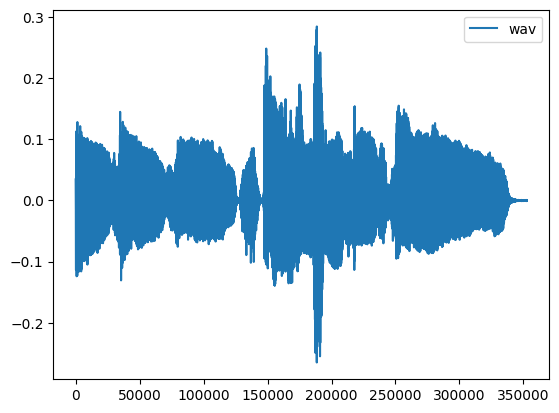

In [ ]:
AUDIO_PATH = '/home/yytung/projects/MixingSecrets/dataset/Plums/raw_tracks/06_LeadVox.wav'
wav, sr = sf.read(AUDIO_PATH)
wav = wav[sr*15:sr*23]
ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.legend()

## Compressor

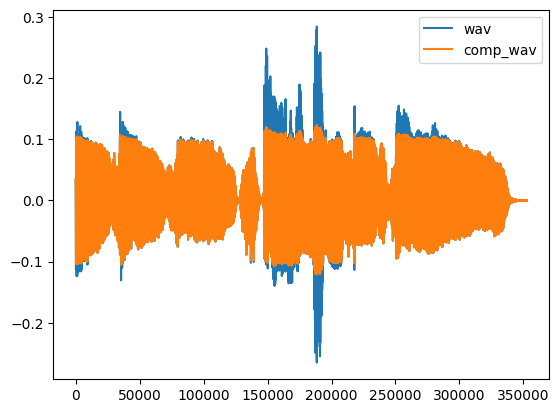

In [3]:
from diffFx_pytorch.processors.dynamics.compressor import Compressor
COMP_DSP_PARAMS = {
    'threshold_db': -20.0,
    'ratio': 5.0,
    'knee_db': 2.0,
    'attack_ms': 10.0,
    'release_ms': 1000.0,
    'makeup_db': 0.0
}

Processor = Compressor(sample_rate=sr).to('cuda')
test_wav = torch.from_numpy(wav).unsqueeze(0).unsqueeze(0).float().to('cuda')
comp_wav = Processor(test_wav, None, COMP_DSP_PARAMS)

ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=comp_wav.squeeze().cpu().numpy(), rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(comp_wav.squeeze().cpu().numpy(),      label='comp_wav')
plt.legend()

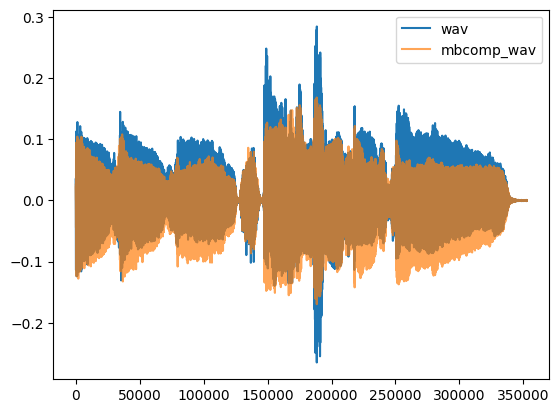

In [ ]:
from diffFx_pytorch.processors.dynamics.compressor import MultiBandCompressor
MBCOMP_DSP_PARAMS = {
    'band0_threshold_db': -24.0,  # Low band
    'band0_ratio': 4.0,
    'band0_knee_db': 2.0,
    'band0_attack_ms': 10.0,
    'band0_release_ms': 100.0,
    'band0_makeup_db': 0.0,
    'band1_threshold_db': -20.0,  # Mid band
    'band1_ratio': 3.0,
    'band1_knee_db': 6.0,
    'band1_attack_ms': 5.0,
    'band1_release_ms': 50.0,
    'band1_makeup_db': 0.0,
    'band2_threshold_db': -20.0,  # High band
    'band2_ratio': 2.0,
    'band2_knee_db': 6.0,
    'band2_attack_ms': 1.0,
    'band2_release_ms': 20.0,
    'band2_makeup_db': 0.0,
    'crossover0_freq': 200.0,     # Low-Mid split
    'crossover1_freq': 2000.0     # Mid-High split
}   

Processor = MultiBandCompressor(sample_rate=sr).to('cuda')
test_wav = torch.from_numpy(wav).unsqueeze(0).unsqueeze(0).float().to('cuda')
mbcomp_wav = Processor(test_wav, None, MBCOMP_DSP_PARAMS)

ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=mbcomp_wav.squeeze().cpu().numpy(), rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(mbcomp_wav.squeeze().cpu().numpy(),    alpha=0.7,  label='mbcomp_wav')
plt.legend()

## Limiter

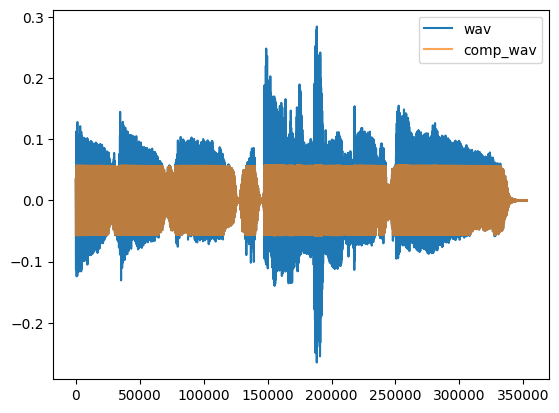

In [5]:
from diffFx_pytorch.processors.dynamics.limiter import Limiter
COMP_DSP_PARAMS = {
    'threshold_db': -25.0,
    'ratio': 80.0,
    'knee_db': 2.0,
    'attack_ms': 10.0,
    'release_ms': 1000.0,
    'makeup_db': 0.0
}

Processor = Limiter(sample_rate=sr).to('cuda')
test_wav = torch.from_numpy(wav).unsqueeze(0).unsqueeze(0).float().to('cuda') 
comp_wav = Processor(test_wav, None, COMP_DSP_PARAMS)

ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=comp_wav.squeeze().cpu().numpy(), rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(comp_wav.squeeze().cpu().numpy(),  alpha=0.7, label='comp_wav')
plt.legend()

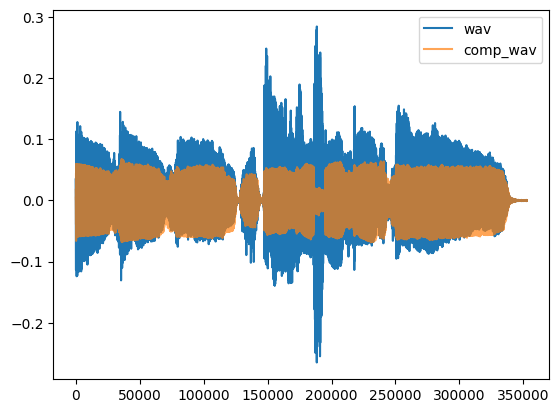

In [6]:
from diffFx_pytorch.processors.dynamics.limiter import MultiBandLimiter
COMP_DSP_PARAMS = {
    'band0_threshold_db': -20.0,   # Low band
    'band0_ratio': 100.0,
    'band0_knee_db': 0.1,
    'band0_attack_ms': 0.1,
    'band0_release_ms': 50.0,
    'band0_makeup_db': 0.0,
    'band1_threshold_db': -30.0,   # Mid band
    'band1_ratio': 100.0,
    'band1_knee_db': 0.1,
    'band1_attack_ms': 0.1,
    'band1_release_ms': 30.0,
    'band1_makeup_db': 0.0,
    'band2_threshold_db': -40.0,   # High band
    'band2_ratio': 100.0,
    'band2_knee_db': 0.1,
    'band2_attack_ms': 0.1,
    'band2_release_ms': 20.0,
    'band2_makeup_db': 0.0,
    'crossover0_freq': 200.0,     # Low-Mid split
    'crossover1_freq': 2000.0     # Mid-High split
}

Processor = MultiBandLimiter(sample_rate=sr).to('cuda')
test_wav = torch.from_numpy(wav).unsqueeze(0).unsqueeze(0).float().to('cuda')
comp_wav = Processor(test_wav, None, COMP_DSP_PARAMS)

ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=comp_wav.squeeze().cpu().numpy(), rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(comp_wav.squeeze().cpu().numpy(),  alpha=0.7, label='comp_wav')
plt.legend()

## Expander

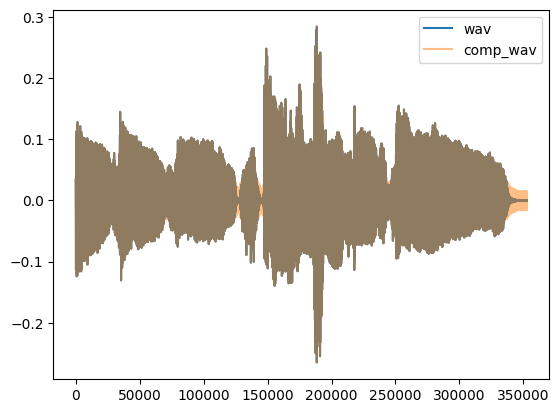

In [7]:
from diffFx_pytorch.processors.dynamics.expander import Expander
COMP_DSP_PARAMS = {
    'threshold_db': -30.0,
    'ratio': 5.0,  
    'knee_db': 1.0,
    'attack_ms': 10,
    'release_ms': 200.0,
    'makeup_db': 0.0
}

Processor = Expander(sample_rate=sr).to('cuda')
test_wav = torch.from_numpy(wav).unsqueeze(0).unsqueeze(0).float().to('cuda')
comp_wav = Processor(test_wav, None, COMP_DSP_PARAMS)

ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=comp_wav.squeeze().cpu().numpy(), rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(comp_wav.squeeze().cpu().numpy(),  alpha=0.5, label='comp_wav')
plt.legend()

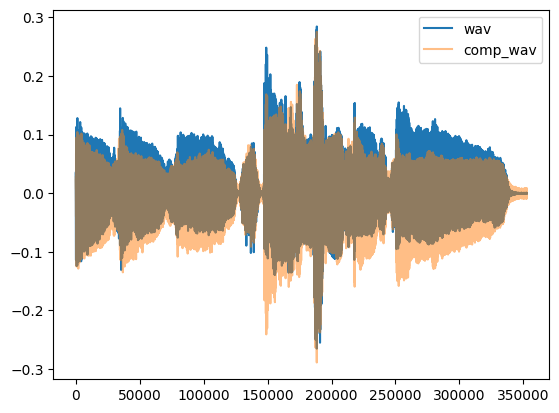

In [ ]:
from diffFx_pytorch.processors.dynamics.expander import MultiBandExpander
COMP_DSP_PARAMS = {
    'band0_threshold_db': -40.0,  # Low band
    'band0_ratio': 4.0,
    'band0_knee_db': 6.0,
    'band0_attack_ms': 10.0,
    'band0_release_ms': 100.0,
    'band1_threshold_db': -40.0,  # Mid band
    'band1_ratio': 3.0,
    'band1_knee_db': 6.0,
    'band1_attack_ms': 5.0,
    'band1_release_ms': 50.0,
    'band2_threshold_db': -40.0,  # High band
    'band2_ratio': 2.0,
    'band2_knee_db': 6.0,
    'band2_attack_ms': 1.0,
    'band2_release_ms': 20.0,
    'crossover0_freq': 200.0,     # Low-Mid split
    'crossover1_freq': 2000.0     # Mid-High split
}  

Processor = MultiBandExpander(sample_rate=sr).to('cuda')
test_wav = torch.from_numpy(wav).unsqueeze(0).unsqueeze(0).float().to('cuda')
comp_wav = Processor(test_wav, None, COMP_DSP_PARAMS)

ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=comp_wav.squeeze().cpu().numpy(), rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(comp_wav.squeeze().cpu().numpy(),  alpha=0.5, label='comp_wav')
plt.legend()

## Noise Gate

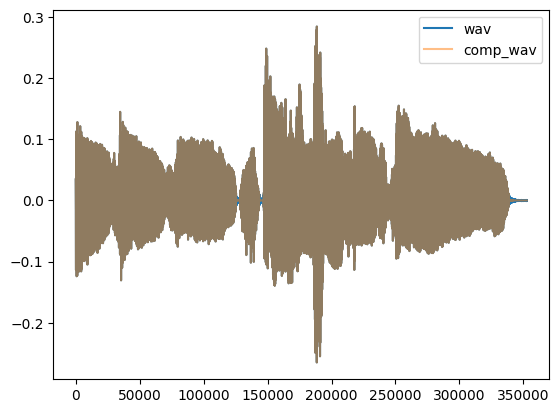

In [ ]:
from diffFx_pytorch.processors.dynamics.noisegate import NoiseGate
COMP_DSP_PARAMS = {
    'threshold_db': -40.0,
    'range_db': -40.0,  
    'knee_db': 2.0,
    'attack_ms': 5,  
    'release_ms': 200.0
}

Processor = NoiseGate(sample_rate=sr).to('cuda')
test_wav = torch.from_numpy(wav).unsqueeze(0).unsqueeze(0).float().to('cuda')
comp_wav = Processor(test_wav, None, COMP_DSP_PARAMS)

ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=comp_wav.squeeze().cpu().numpy(), rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(comp_wav.squeeze().cpu().numpy(),  alpha=0.5, label='comp_wav')
plt.legend()

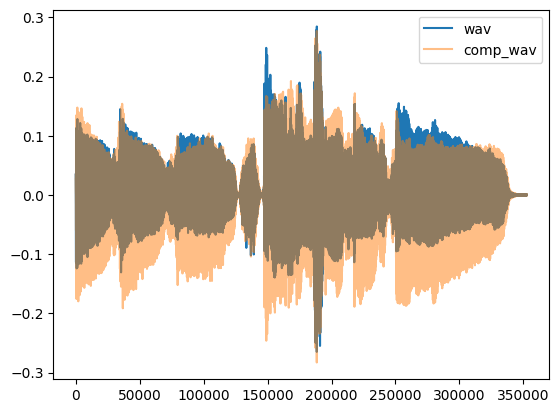

In [ ]:
from diffFx_pytorch.processors.dynamics.noisegate import MultiBandNoiseGate
COMP_DSP_PARAMS = {
    'band0_threshold_db': -24.0,  # Low band
    'band0_range_db': 4.0,
    'band0_knee_db': 6.0,
    'band0_attack_ms': 10.0,
    'band0_release_ms': 100.0,
    'band1_threshold_db': -20.0,  # Mid band
    'band1_range_db': 3.0,
    'band1_knee_db': 6.0,
    'band1_attack_ms': 5.0,
    'band1_release_ms': 50.0,
    'band2_threshold_db': -30.0,  # High band
    'band2_range_db': 2.0,
    'band2_knee_db': 6.0,
    'band2_attack_ms': 1.0,
    'band2_release_ms': 20.0,
    'crossover0_freq': 200.0,     # Low-Mid split
    'crossover1_freq': 2000.0     # Mid-High split
}   

Processor = MultiBandNoiseGate(sample_rate=sr).to('cuda')
test_wav = torch.from_numpy(wav).unsqueeze(0).unsqueeze(0).float().to('cuda')
comp_wav = Processor(test_wav, None, COMP_DSP_PARAMS)

ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=comp_wav.squeeze().cpu().numpy(), rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(comp_wav.squeeze().cpu().numpy(),  alpha=0.5, label='comp_wav')
plt.legend()

## Transient Shaper

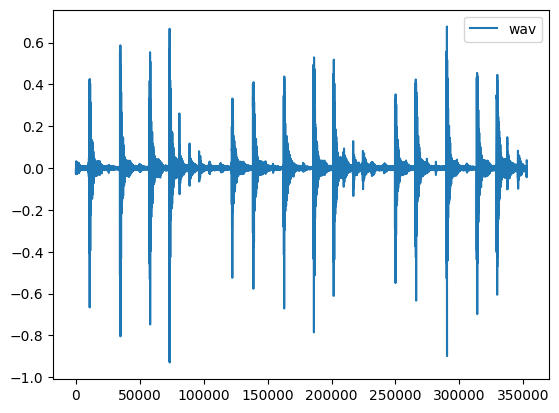

In [1]:
import torch
import numpy as np
import math
import matplotlib.pyplot as plt
import IPython.display as ipd
import soundfile as sf
AUDIO_PATH = '/home/yytung/projects/MixingSecrets/dataset/Polemic/raw_tracks/02_Snare.wav'
wav, sr = sf.read(AUDIO_PATH)
wav = wav[sr*15:sr*23]
ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.legend()

In [5]:
from diffFx_pytorch.processors.dynamics import DrumTransientShaper
COMP_DSP_PARAMS = {
    'power_mem_ms': 1.0,
    'fast_attack_ms': 1,
    'slow_attack_ms': 15.0,
    'release_ms': 20.0
}

Processor = DrumTransientShaper(sample_rate=sr, mode='sustain').to('cuda')
test_wav = torch.from_numpy(wav).unsqueeze(0).unsqueeze(0).float().to('cuda')
comp_wav = Processor(test_wav, None, COMP_DSP_PARAMS)

ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=comp_wav.squeeze().cpu().numpy(), rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(comp_wav.squeeze().cpu().numpy(),  alpha=0.5, label='comp_wav')
plt.legend()

ValueError: Audio data must be between -1 and 1 when normalize=False.

In [20]:
import numpy 
def envelope(x, fs):
    attack = 1 #params[0]
    fast_attack = 1 #params[1]
    slow_attack = 15 #params[2]
    release = 20 #params[3]
    power_mem = 1 #params[4]

    g_fast = numpy.exp(-1.0 / (fs * fast_attack / 1000.0))
    g_slow = numpy.exp(-1.0 / (fs * slow_attack / 1000.0))
    g_release = numpy.exp(-1.0 / (fs * release / 1000.0))
    g_power = numpy.exp(-1.0 / (fs * power_mem / 1000.0))

    fb_fast = 0
    fb_slow = 0
    fb_pow = 0

    N = len(x)

    fast_envelope = numpy.zeros(N)
    slow_envelope = numpy.zeros(N)
    attack_gain_curve = numpy.zeros(N)

    x_power = numpy.zeros(N)
    x_deriv_power = numpy.zeros(N)

    for n in range(N):
        x_power[n] = (1 - g_power) * x[n] * x[n] + g_power * fb_pow
        fb_pow = x_power[n]

    x_deriv_power[0] = x_power[0]

    # simple differentiator filter
    for n in range(1, N):
        x_deriv_power[n] = x_power[n] - x_power[n - 1]

    for n in range(N):
        if fb_fast > x_deriv_power[n]:
            fast_envelope[n] = (1 - g_release) * x_deriv_power[n] + g_release * fb_fast
        else:
            fast_envelope[n] = (1 - g_fast) * x_deriv_power[n] + g_fast * fb_fast
        fb_fast = fast_envelope[n]

        if fb_slow > x_deriv_power[n]:
            slow_envelope[n] = (1 - g_release) * x_deriv_power[n] + g_release * fb_slow
        else:
            slow_envelope[n] = (1 - g_slow) * x_deriv_power[n] + g_slow * fb_slow
        fb_slow = slow_envelope[n]

        attack_gain_curve[n] = fast_envelope[n] - slow_envelope[n]

    attack_gain_curve /= numpy.max(attack_gain_curve)

    if attack == 1:
        # normalize to [0, 1.0]
        return x * attack_gain_curve 

    # sustain curve is the inverse
    return x * (1 - attack_gain_curve)

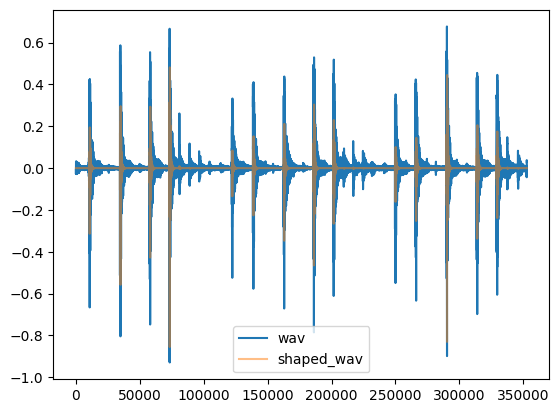

In [21]:
shaped_wav = envelope(wav, sr)
ipd.display(ipd.Audio(data=wav, rate=sr, normalize=False))
ipd.display(ipd.Audio(data=shaped_wav, rate=sr, normalize=False))

plt.figure(dpi=100)
plt.plot(wav,      label='wav')
plt.plot(shaped_wav,  alpha=0.5, label='shaped_wav')
plt.legend()